# Исследование эго графа

Данные из соцсети ВКонтакте о моих друзьях и друзьях друзей.

В отдельных файлах есть:

* список идентификаторов друзей и друзей друзей
* список идентификаторов общих друзей с друзьями первого круга
* описание друзей
* группы каждого человека (ограничение: максимум 75 у пользователя)
* описание групп

**Описание задачи:**

1. С помощью API соцсети ВКонтакте достать граф моих друзей и друзей друзей. 
Данные получены локально и сохранены на Google Drive.

2. Нужно исследовать свойства графа:

    - найти кластеры;
    - найти важные вершины и рёбра;
    - проанализировать структуру графа в целом. 

3. Бонус: научиться рекомендовать друзей друг другу.


# 1. Загрузка данных

In [ ]:
import os

import numpy as np 
import pandas as pd
import networkx as nx

from tqdm import tqdm 
  
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
 
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, roc_auc_score 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
dirname = '/content/drive/MyDrive/Sber DS School/Final Project/data'

### `friends` 

список идентификаторов друзей и друзей друзей

- `FriendId` - ID друга первого круга, int64
- `DeepFriendId` - ID друга второго круга, int64

In [ ]:
friends = pd.read_csv(
    os.path.join(dirname, 'friends2.csv'), 
    names=['FriendId', 'DeepFriendId']
)

friends

,FriendId,DeepFriendId
0,5913105,427958
1,5913105,714643
2,5913105,739876
3,5913105,757959
4,5913105,819023
...,...,...
41001,658587830,313364479
41002,658587830,350883879
41003,658587830,359432540
41004,658587830,535669941


### `mutual_friends` 

список идентификаторов общих друзей с друзьями первого круга

- `FriendId` - ID друга первого круга, int64
- `CommonFriendId` - ID общего друга с `FriendId`, int64

In [ ]:
mutual_friends = pd.read_csv(
    os.path.join(dirname, 'mutual_friends2.csv'), 
    header=0
)

mutual_friends

,FriendId,CommonFriendId
0,139684355,74070869
1,139684355,88537623
2,139684355,93765200
3,139684355,127439390
4,139684355,132205828
...,...,...
3819,202184190,308969022
3820,202184190,327350834
3821,202184190,403969042
3822,202184190,494531747


Есть два друга, с которыми у меня нет общих друзей. Это не является недостатком данных, т.к. для некоторых моих друзей пользователи с id `115761959` и `569958736` общие для нас.

In [ ]:
np.setdiff1d(
    mutual_friends['CommonFriendId'].unique(), 
    mutual_friends['FriendId'].unique()
)

array([115761959, 569958736])

### `friends_desc` 

описание всех друзей

- `Name` - имя и фамилия друга, int64
- `Sex` - пол, строка вида "Male/Female"
- `Bdate` - дата рождения, строка с разделителем "."
- `City` - город друга, строка

В колонках `Bdate` и `City` **много пропущенных значений**

In [ ]:
friends_desc = pd.read_csv(
    os.path.join(dirname, 'friends_desc.csv'), 
    header=0
)

friends_desc.head(1)

,FirstName,LastName,Sex,Bdate,City
41156612,Азат,Ахметзянов,2,NaN,Туймазы


In [ ]:
friends_desc['Name'] = friends_desc['FirstName'].str.cat(friends_desc['LastName'], sep=' ')
friends_desc = friends_desc[['Name', 'Sex', 'Bdate', 'City']]

In [ ]:
def to_sex(sex):
    if int(sex) == 1:
        return 'Female'
    elif int(sex) == 2:
        return 'Male'
    return 'Unknown'


friends_desc['Sex'] = friends_desc['Sex'].astype(str).apply(to_sex)

In [ ]:
friends_desc

,Name,Sex,Bdate,City
41156612,Азат Ахметзянов,Male,NaN,Туймазы
110886925,Евгения Соколова,Female,3.9.1990,Москва
304349199,Лейсан Шакирова,Female,22.12,NaN
156368914,Саша Волков,Male,17.12,Ижевск
225181724,Гульнара Фарвазова,Female,NaN,NaN
...,...,...,...,...
396361693,Марк Мукминов,Male,2.3,NaN
412090341,Вика Красикова,Female,3.10.2001,Омск
443285484,Лиана Валиева,Female,28.8.2001,Казань
379584495,Слава Карелин,Male,16.6,NaN


**Выделим описание общих друзей в отдельную таблицу.** 

В колонке `City` было много пропущенных значений. Предварительно я заполнил их правильными значениями

In [ ]:
# mutual_friends_desc = friends_desc.loc[mutual_friends['CommonFriendId'].unique()]
# mutual_friends_desc.to_csv(os.path.join(dirname, 'mutual_friends_desc.csv'))

In [ ]:
mutual_friends_desc = pd.read_csv(
    os.path.join(dirname, 'mutual_friends_desc.csv'), 
    index_col='Id'
)

mutual_friends_desc.head()

,Name,Sex,Bdate,City
Id,,,,
74070869,Ляйсан Сафарова,Female,26.3.2001,Казань
88537623,Диана Монжосова,Female,13.5.2001,Казань
93765200,Алсу Гибадуллина,Female,5.12,Чистополь
127439390,Азат Гилязов,Male,23.9.2001,Туймазы
132205828,Делечка Кукушкина,Female,5.2.2001,Казань


### `groups` 

группы каждого человека

- `UserId` - ID друга, int64
- `GroupId` - ID группы, int64

In [ ]:
groups = pd.read_csv(
    os.path.join(dirname, 'friend_groups.csv'), 
    header=0
)

groups

,UserId,GroupId
0,41156612,34118551
1,41156612,125942238
2,41156612,40835481
3,41156612,25397178
4,41156612,83034492
...,...,...
122909,13158259,115988972
122910,13158259,116204021
122911,13158259,156098021
122912,13158259,194290192


### `groups_desc` 

описание групп

- `Name` - название сообщества, строка
- `ScreenName` - короткий адрес (например, scifacts), строка
- `Type` - тип сообщества (group — группа, page — публичная страница, event — мероприятие)
- `Description` - текст описания сообщества, строка


In [ ]:
groups_desc = pd.read_csv(os.path.join(dirname, 'groups_desc.csv'), header=0, index_col='GroupId')
groups_desc

,Name,ScreenName,Type,Description
GroupId,,,,
34118551,Наука и Факты,scifacts,page,Входим в топ-3 познавательных сообществ ВК.
125942238,Туймазы -1 | полезный паблик города,tuymazy1,page,✔ Проверенная и полезная информация в городе Т...
40835481,Черный юмор,tophumor,page,Любишь чернее черной черноты бесконечности? То...
25397178,Мужские мысли,strog_pocan,page,Интеллигентное мужское сообщество. У нас Вы мо...
83034492,Вы это видели?,club83034492,group,NaN
...,...,...,...,...
115988972,"ТОБОО ""ЗаРождение"" Гуманитарный склад г.Тобольск",gumanitarsklad,page,Реализуем проекты:\n1. Гуманитарный склад помо...
116204021,"МАУ ""Тобольский районный Центр культуры""",mau.trck.tobolsk,page,Мы рады приветствовать Вас в группе муниципаль...
156098021,Концерты в католическом храме Тобольска,katolik_koncert,page,Дорогие друзья!\nЗдесь вы можете узнавать инфо...


# 2. Визуализация графа в NetworkX

## 2.1 Создание графа

Будем исследовать граф друзей и общих друзей. Создадим объекта графа, представленного в виде списка рёбер.

In [ ]:
G = nx.from_pandas_edgelist(mutual_friends, source='FriendId', target='CommonFriendId')

In [ ]:
print(nx.info(G))

Name: 
Type: Graph
Number of nodes: 201
Number of edges: 1923
Average degree:  19.1343


## 2.2 Исследование вершин

Построим график распределения степеней вершин графа. 

In [ ]:
degree_sequence = sorted([d for n, d in G.degree()], reverse=True)

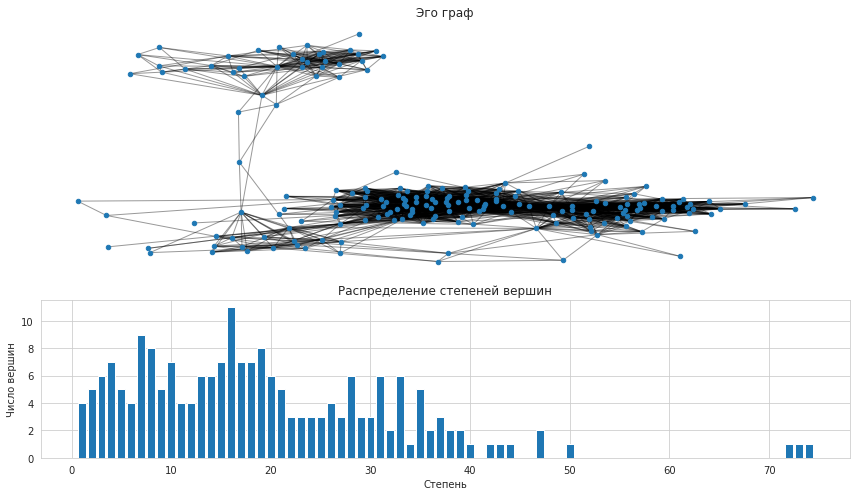

In [ ]:
with sns.plotting_context(font_scale=1.5), sns.axes_style('whitegrid'):
    fig = plt.figure(figsize=(12, 7))
    axgrid = fig.add_gridspec(5, 3)

    ax0 = fig.add_subplot(axgrid[:3, :])
    pos = nx.spring_layout(G, seed=20212021)
    nx.draw_networkx_nodes(G, pos, ax=ax0, node_size=20)
    nx.draw_networkx_edges(G, pos, ax=ax0, alpha=0.4)
    ax0.set_title("Эго граф")
    ax0.set_axis_off()

    ax2 = fig.add_subplot(axgrid[3:, :])
    ax2.bar(*np.unique(degree_sequence, return_counts=True))
    ax2.set_title("Распределение степеней вершин")
    ax2.set_xlabel("Степень")
    ax2.set_ylabel("Число вершин")

    fig.tight_layout()
    plt.show()

## 2.3 Представление графа в другом формате

Поэксперементируем с разными форматами представления графов в NetworkX. Экспортируем наш граф в формат GEXF (Graph Exchange XML Format)

In [ ]:
nx.write_gexf(G, dirname + '/ego_graph.gexf')

In [ ]:
ego_graph = nx.read_gexf(dirname + '/ego_graph.gexf', node_type=int)
print(nx.info(ego_graph))

Name: 
Type: Graph
Number of nodes: 201
Number of edges: 1923
Average degree:  19.1343


## 2.4 NetworkX with Matplotlib & Seaborn

Нарисуем эго граф, закрасив вершины друзей женского пола в розовый цвет, а мужчин в синий. Но прежде в каждую вершину графа добавим атрибут "пол друга".

**Добавление атрибутов в вершины графа**

Создадим словарь, где каждому идентификатору пользователя сопоставим его имя. Каждую вершину графа пометим именем пользователя. Также сделаем обратное отображение (имя: идентификатор), т.к. все имена получиличь уникальными.

In [ ]:
user_names = friends_desc.loc[list(ego_graph.nodes())]['Name']

label_mapping = dict(user_names)
label_inv_mapping = {v: k for k, v in label_mapping.items()}

ego_graph = nx.relabel_nodes(ego_graph, label_mapping)

In [ ]:
male_or_female = dict()

for uid in pd.concat((mutual_friends['FriendId'], mutual_friends['CommonFriendId'])).unique():
    male_or_female[label_mapping[uid]] = friends_desc.loc[uid]['Sex']

In [ ]:
male_or_female['Урал Нуркаев']

'Male'

In [ ]:
# apply the male_or_female mapping of friends
nx.set_node_attributes(ego_graph, male_or_female, 'sex')

In [ ]:
def create_color_map(graph, attribute, seaborn_palette='muted'):
    '''Return a list of hex color mappings for node attributes'''
    attributes = [graph.nodes[label][attribute] for label in graph.nodes()]
    
    # get the set of possible attributes
    attributes_unique = list(set(attributes))
    num_values = len(attributes_unique)
    
    # generate color palette
    palette = sns.color_palette(seaborn_palette, num_values).as_hex()
    
    # create a mapping of attribute to color
    color_map = dict(zip(attributes_unique, palette))
    
    # map the attribute for each node to the color it represents
    node_colors = [color_map[attribute] for attribute in attributes]
    
    return node_colors, color_map, palette

Внимательный читатель обратит внимание на странный формат цвета. В 2010 году популярный онлайн-комикс [xkcd](https://xkcd.com/) провёл [соцопрос](https://blog.xkcd.com/2010/05/03/color-survey-results/), по результатам которого подобрал названия для [954 самых используемых RGB-цветов](https://xkcd.com/color/rgb/). Это упрощает жизнь огромному количеству людей, от дизайнеров до аналитиков и учёных. 

Больше о палитрах можно прочитать в [официальной документации](https://seaborn.pydata.org/tutorial/color_palettes.html).

In [ ]:
node_colors, color_map, palette = create_color_map(
    ego_graph, attribute='sex', 
    seaborn_palette=['#fe46a5', '#056eee'] # barbie pink, cerulean blue
)

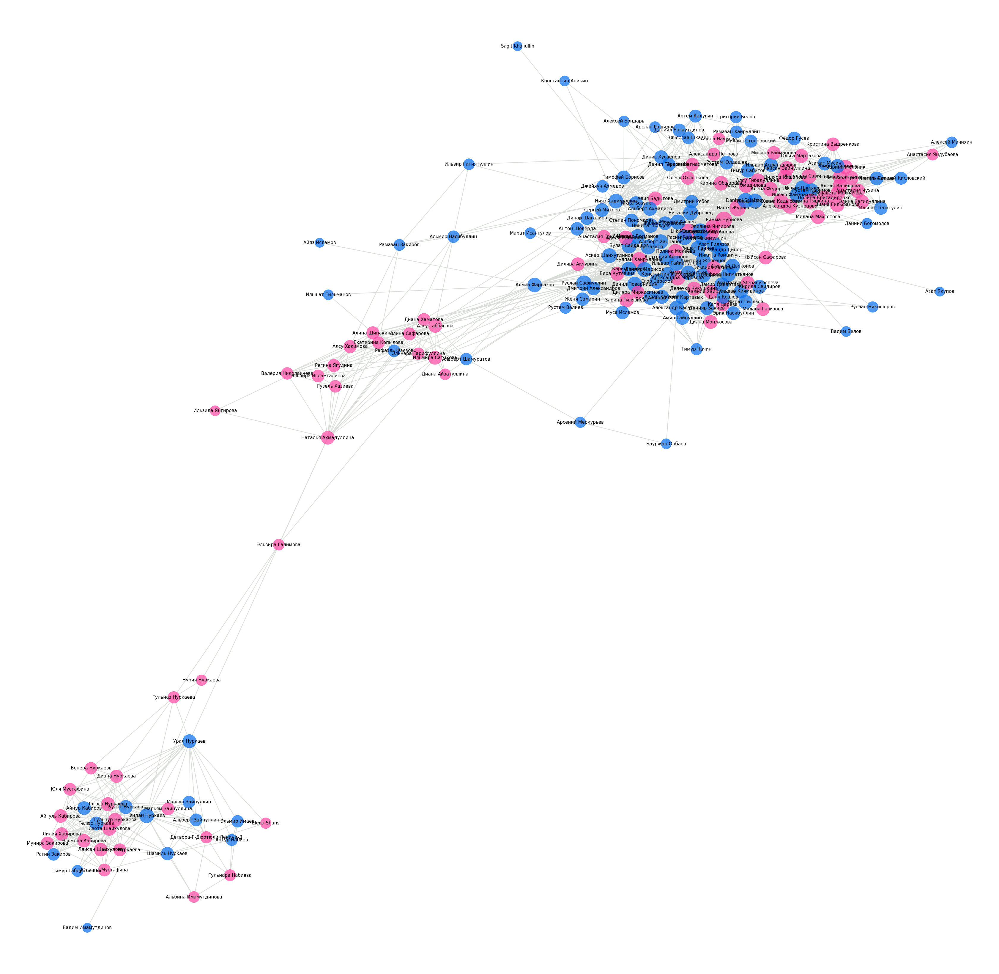

In [ ]:
with sns.axes_style('white'):
    plt.figure(figsize=(60, 60))

    # generate the layout and place nodes with edges
    layout = nx.spring_layout(ego_graph, seed=2021)

    # plot nodes, labels and edges with options
    node_size = [1000 * np.sqrt(np.sqrt(d[1])) for d in ego_graph.degree()]
    nx.draw_networkx_nodes(ego_graph, layout, node_color=node_colors, node_size=node_size, alpha=0.7)
    nx.draw_networkx_edges(ego_graph, layout, width=2, edge_color='#d8dcd6')  # light gray
    nx.draw_networkx_labels(ego_graph, pos=layout, font_size=15)

    plt.axis('off')
    plt.show()

# 3. Кластеризация

Моя цель построить красивый и содержательный граф, поэтому выполним следующие условия:

- Цвет вершины означает принадлежность кружочка (человека) кластеру
- Диаметр кружочка соответствует количеству моих общих друзей с ним
- Вершины из одного кластера покрашены в один цвет
- Все кластеры различны по цвету

*Добавить в будущем, чтобы цвет ребра означал принадлежность обеих вершин данному кластеру, а серый цвет соответствовал рёбрам, соединяющим вершины из разных кластеров.*

Используем для этих целей цветовую палитру `muted` из `seaborn`, которая хорошо подходит для категориальных типов.

Крутая [статья](https://habr.com/ru/company/dca/blog/265077/) c кластеризацией графа веб-доменов, посещённых людьми за разное время. 

## 3.1 Louvain Clustering

**Modularity** (свойство модулярности) - это величина, которая показывает насколько в графе выражено наличие разных сообществ. Данная метрика пришла к нам из области Network Science, в которой изучаются разные свойства графов.
Modularity тем выше, чем выше плотность сообществ внутри кластеров, и тем ниже, чем эти сообщества более разреженные.

На этом подходе основан алгоритм иерархической кластеризации **Louvain Method**, который максимизирует Modularity графа. Алгоритм Louvain следит за тем, как связаны вершина внутри кластера друг с другом и с вершинами вне этого кластера.

Достоинства:
+ Непараметрический
+ Интерпретируемый, т.к. максимизует понятную величину, modularity
+ Быстрый, эмпирическая оценка времени: ${\displaystyle O(|V|×log(|V|))}$
+ Даёт иерархическую кластеризацию "бесплатно"

Недостатки: 
- Главный недостаток - resolution limit модулярности, часто относит важные маленькие скопления вершин к кластерам с высокой модулярностью.

Несмотря на недостатки один из самых широкоизвестных методов за счет быстроты.
***

Реализация в библиотеке Community: [Community detection for NetworkX’s documentation](https://perso.crans.org/aynaud/communities/)

In [ ]:
import community as community_louvain

# compute the best partition
partition = community_louvain.best_partition(ego_graph, random_state=42)

In [ ]:
# apply the louvain_cluster mapping of friends
nx.set_node_attributes(ego_graph, partition, 'louvain_cluster')

In [ ]:
node_colors, color_map, palette = create_color_map(ego_graph, 'louvain_cluster')

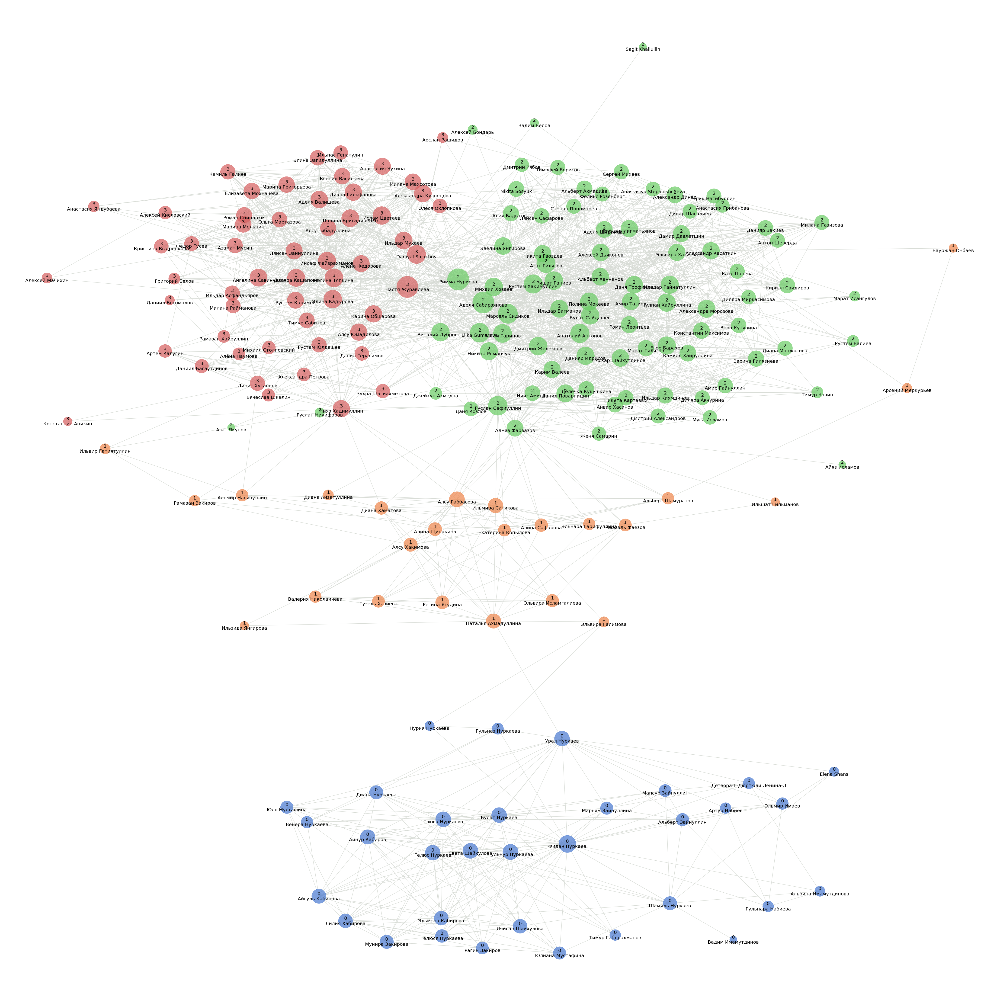

In [ ]:
with sns.axes_style('white'):
    plt.figure(figsize=(60, 60))

    # generate the layout and place nodes with edges
    layout = nx.kamada_kawai_layout(ego_graph)

    # plot nodes, labels and edges with options
    # node size is a list of degrees of nodes
    node_size = [1000 * np.sqrt(d[1]) for d in ego_graph.degree()]
    # edge_width = [0.7 * np.sqrt(d[1]) for d in ego_graph.degree()]
    nx.draw_networkx_nodes(ego_graph, layout, node_color=node_colors, node_size=node_size, alpha=0.7)
    nx.draw_networkx_edges(ego_graph, layout, width=1.5, edge_color='#d8dcd6')  # light gray

    labels = {
        label:
        str(ego_graph.nodes[label]['louvain_cluster']) + '\n' + str(label)
        for label in ego_graph.nodes()
    }
    nx.draw_networkx_labels(ego_graph, pos=layout, labels=labels, font_size=20)
    plt.axis('off')
    plt.tight_layout()

Алгоритм Louvain Clustering определил 4 сообщества в графе:

- **0** - родственники;
- **1** - школьные друзья и одноклассники;
- **2** - однокурсники (2 курс);
- **3** - студенты с младших (1) и старших курсов (3, 4) моего института.

## 3.2 Spectral Clustering

Достоинства:

- Научно обоснованный, т.к. оптимизирует нормализованный разрез графа
- Определяет сложные важные кластеры

Недостатки:

- Нужно подбирать параметр k (число кластеров)
- Большая вычислительная сложность

In [ ]:
from sklearn.cluster import SpectralClustering

np.random.seed(1)
adj_mat = nx.to_numpy_matrix(ego_graph)

params = {
    "n_clusters": 5, 
    "affinity": 'precomputed', 
    "n_init": 1000, 
    "n_jobs": -1
}
spectral_model = SpectralClustering(**params)
spectral_model.fit(adj_mat)

SpectralClustering(affinity='precomputed', assign_labels='kmeans', coef0=1,
                   degree=3, eigen_solver=None, eigen_tol=0.0, gamma=1.0,
                   kernel_params=None, n_clusters=5, n_components=None,
                   n_init=1000, n_jobs=-1, n_neighbors=10, random_state=None)

In [ ]:
spectral_labels_mapping = dict(zip(list(ego_graph.nodes), 
                                   spectral_model.labels_))
# apply the spectral_cluster mapping of friends
nx.set_node_attributes(ego_graph, spectral_labels_mapping, 'spectral_cluster')

In [ ]:
node_colors, color_map, palette = create_color_map(ego_graph, 'spectral_cluster')

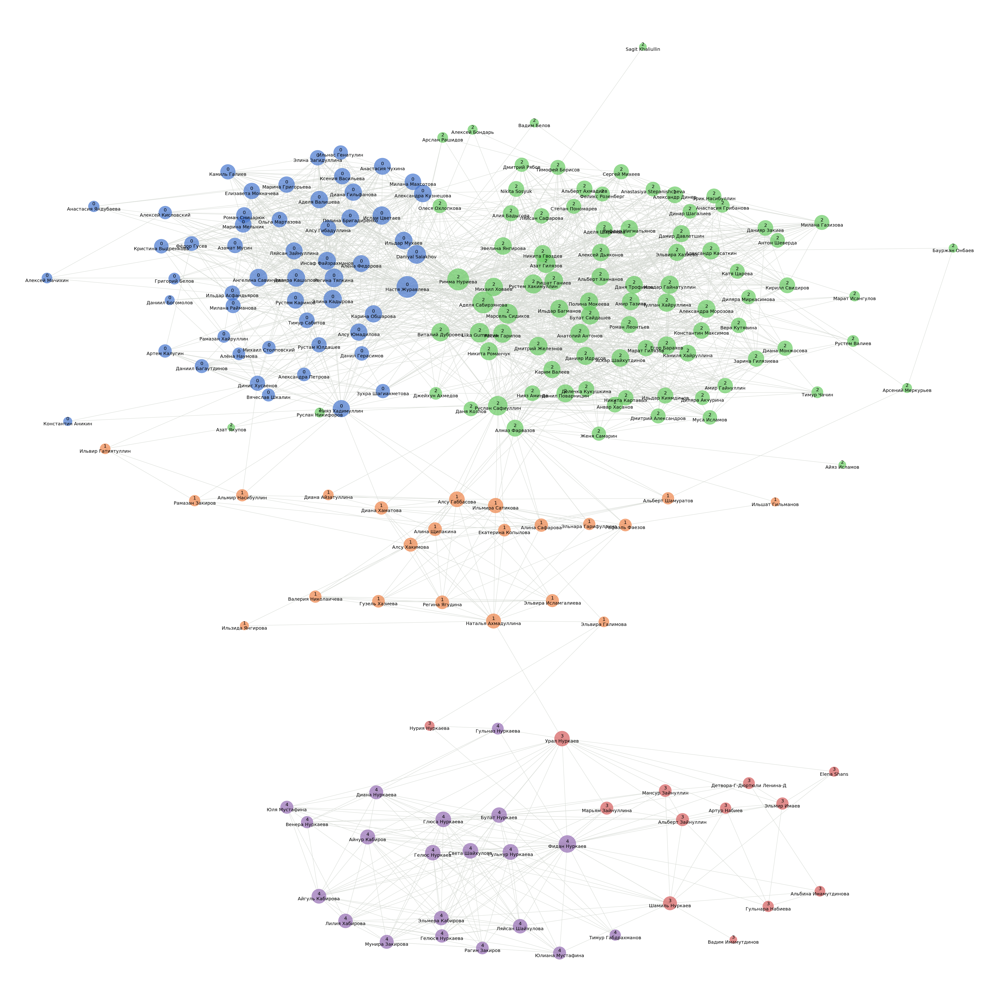

In [ ]:
with sns.axes_style('white'):
    plt.figure(figsize=(60, 60))

    # generate the layout and place nodes with edges
    layout = nx.kamada_kawai_layout(ego_graph)

    # plot nodes, labels and edges with options
    # node size is a list of degrees of nodes
    node_size = [1000 * np.sqrt(d[1]) for d in ego_graph.degree()]
    # edge_width = [0.7 * np.sqrt(d[1]) for d in ego_graph.degree()]
    nx.draw_networkx_nodes(ego_graph, layout, node_color=node_colors, node_size=node_size, alpha=0.7)
    nx.draw_networkx_edges(ego_graph, layout, width=1.5, edge_color='#d8dcd6')  # light gray

    labels = {
        label:
        str(ego_graph.nodes[label]['spectral_cluster']) + '\n' + str(label)
        for label in ego_graph.nodes()
    }
    nx.draw_networkx_labels(ego_graph, pos=layout, labels=labels, font_size=20)
    plt.axis('off')
    plt.tight_layout()

Алгоритм **Spectral Clustering** смог определить внутри "родственников" важные кластеры: родственников по линии мамы (номер 3) и линии папы (номер 4). В остальном, получены всё те же сообщества.

Скорее всего **Louvain Method** объединил оба эти кластеры в один, т.к. он часто относит важные маленькие скопления вершин к кластерам с высокой модулярностью. В этом смысле спектральная кластеризация оказалась лучше.

# 4. Подробный анализ графа

## 4.1 Degree Centrality

Первая мера, которую мы рассмотрим - это **центральность по степени**. Идея простая: чем больше количество узлов, с которыми соединен наш узел, тем выше его важность. Иначе говоря, центральности по степени показывает долю вершин, с которыми имеется связь.

Вычисляется как отношение степени вершины на общее количество вершин в графе:

${\displaystyle C_D(u)={deg(u) \over n-1}}$

In [ ]:
degree_centrality = nx.degree_centrality(ego_graph)

Выведем топ-5 вершин по степени центральности

In [ ]:
# Top 5.
sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:5]

Переведём полученные доли вершин в количество связей

In [ ]:
# Top 5.
sorted(dict(ego_graph.degree).items(), key=lambda x: x[1], reverse=True)[:5]

Эти вершины неспроста имеют самые высокие значения степени центральности. Римма Нуриева, Аделя Сабирзянова, Настя Журавлева и Руслан Сафиуллин - это активисты моего института, поэтому у них много друзей. Марсель Сидиков преподаватель по Джаве.

## 4.2 Closeness Centrality

Следующая мера - это **центральность по близости**. Эта величина показывает, насколько одна вершина ближе к другой. Чем меньше вершин между текущей вершин и другими вершинами, тем ниже показатель близости и выше степень близости.

${\displaystyle C_D(u)={n-1 \over \Sigma_{v=1}^{n-1}d(v,u)}}$

In [ ]:
closeness_centrality = nx.closeness_centrality(ego_graph)

In [ ]:
# Top 5.
sorted(closeness_centrality.items(), key=lambda x: x[1], reverse=True)[:5]

На первом месте по величине этой метрики оказался Руслан Сафиуллин и это обоснованно, т.к. у него большое количество друзей в нескольких кластерах. То же самое верно и для других полученных вершин.

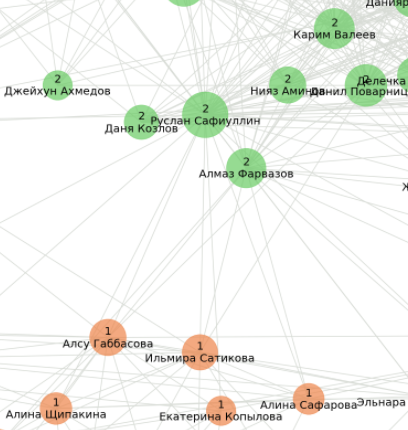

# 5. Link Prediction

Цель прогнозирования связей состоит в том, чтобы определить пары узлов, которые либо сформируют связь, либо нет в будущем.

## 5.1 Построение обучающей выборки

Мы можем случайным образом скрыть некоторые ребра из графа, чтобы создать обучающий набор данных с положительными и негативными примерами.

In [ ]:
# Несвязанные пары вершин
all_unconnected_pairs = list(nx.non_edges(ego_graph))

Вот сколько несвязанных пар есть в нашем графе:

In [ ]:
len(all_unconnected_pairs)

У нас 17602 несвязанные пары. Эти пары узлов будут действовать как негативные примеры во время обучения модели. Сохраним эти пары в таблицу:

In [ ]:
node_1_unlinked = [u for u, v in all_unconnected_pairs]
node_2_unlinked = [v for u, v in all_unconnected_pairs]

data = pd.DataFrame({
    'node_1': node_1_unlinked, 
    'node_2': node_2_unlinked
})

# Добавим целевую переменную link
data['link'] = 0

In [ ]:
data

Теперь сформируем положительные примеры (удаленные ссылки из пар вершин, которые были соединены).

Мы будем случайным образом отбрасывать некоторые ребра из графа. Однако случайное удаление ребер может привести к отсечению слабо связанных вершин. Мы должны убедиться, что в процессе отбрасывания ребер все вершины графа останутся связанными.

Сначала проверим, приводит ли удаление пары вершин к уменьшению числа вершин или к увеличению числа компонент связности графа. Если ничего из этого не происходят, то мы отбросим эту пару вершин и повторим тот же процесс со следующей парой вершин.

В конце концов, мы получим список пар вершин, которые могут быть удалены из графа, и это не приведет ни к уменьшению числа вершин, ни к увеличению числа компонент связности графа.

In [ ]:
links_df = mutual_friends.copy()
links_df.columns = ["node_1", "node_2"]
links_df["node_1"] = links_df["node_1"].apply(lambda x: label_mapping[x])
links_df["node_2"] = links_df["node_2"].apply(lambda x: label_mapping[x])

In [ ]:
initial_node_count = len(ego_graph.nodes)

links_df_temp = links_df.copy()

removable_links_index = []

# пройдем по всем парам связей вершин в графе
for i in tqdm(links_df.index.values):
  
  # построим новый граф с одной удалённой связью
  G_temp = nx.from_pandas_edgelist(links_df_temp.drop(index = i), "node_1", "node_2")
  G_temp = nx.relabel_nodes(G_temp, label_mapping)
  
  # проверяем, что при удалении связи 
  # эта пара вершин не исчезает и не увеличивается число компонент связности
  if (len(G_temp.nodes) == initial_node_count) and (nx.number_connected_components(G_temp) == 1):
    removable_links_index.append(i)
    links_df_temp = links_df_temp.drop(index = i)

In [ ]:
len(removable_links_index)

**Данные для обучения модели**

Далее мы добавим эти ребра в таблицу несвязанных пар вершин `data`. Поскольку эти новые ребра являются положительными примерами, они будут иметь целевое значение **1**:

In [ ]:
# создадим таблицу с ребрами, которые можно удалить
links_df_ghost = links_df.loc[removable_links_index]

# добавим целевую переменную link
links_df_ghost['link'] = 1

data = data.append(links_df_ghost[['node_1', 'node_2', 'link']], ignore_index=True)

In [ ]:
data

Посмотрим на распределение значений целевой переменной:

In [ ]:
data['link'].value_counts()

Это несбалансированные данные. Соотношение **link=1** и **link=0** близко к 20%. 
***
Дальше мы будем извлекать функции для всех этих пар вершин.

## 5.2 Извлечение признаков

Создадим новый граф после удаления связей:

In [ ]:
# выкидываем вершины, которые можно удалить
links_df_partial = links_df.drop(index=links_df_ghost.index.values)

# строим граф на полученных вершинах и связях
G_data = nx.from_pandas_edgelist(links_df_partial, "node_1", "node_2")
G_data = nx.relabel_nodes(G_data, label_mapping)

In [ ]:
# apply the male_or_female mapping of friends
nx.set_node_attributes(G_data, male_or_female, 'sex')

1. Посчитаем метрику Жаккарда по друзьям

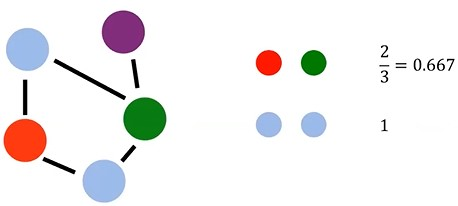

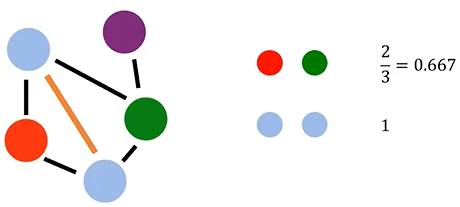

In [ ]:
def merge_two_cols(series): 
        return (series['node_1'], series['node_2'])

data['ebunch'] = data.apply(merge_two_cols, axis=1)

In [ ]:
jc = nx.jaccard_coefficient(G_data, data['ebunch'].values)

jaccard_coefficients = list()
for u, v, p in jc:
    jaccard_coefficients.append(p)
    # print(f"{u} - {v} -> {p}")

In [ ]:
data['JAC'] = jaccard_coefficients

In [ ]:
data.sample(5)

2. Добавим бинарный признак `SameCity`:

- **1** - если люди из одного города
- **0** - из разных городов

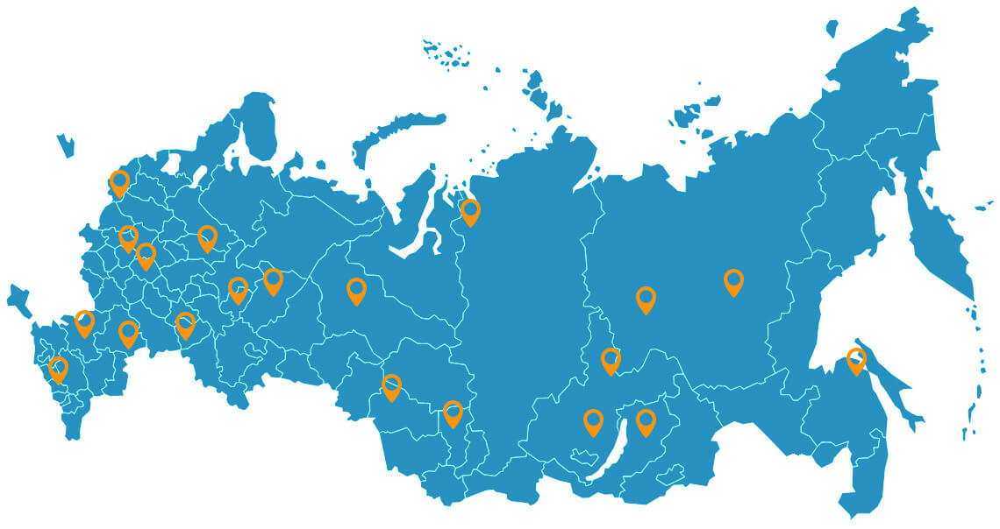

In [ ]:
same_city = list()

for u, v in tqdm(data['ebunch']):
    u_city = mutual_friends_desc.loc[label_inv_mapping[u]].City
    v_city = mutual_friends_desc.loc[label_inv_mapping[v]].City
    if u_city == v_city:
        same_city.append(1)
    else:
        same_city.append(0)

In [ ]:
data['SameCity'] = same_city

In [ ]:
data['SameCity'].value_counts()

Признак получился сбалансированным

In [ ]:
data.sample(5)

## 5.3 Обучение модели

Разделим на обучающую и тестовые выборки

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(
    data[['JAC', 'SameCity']], data['link'], 
    test_size = 0.2, 
    random_state = 2021
)

In [ ]:
x_test

### Logistic Regression

In [ ]:
lr_model = LogisticRegression(class_weight="balanced")

lr_model.fit(x_train, y_train)

In [ ]:
lr_predictions = lr_model.predict_proba(x_test)

In [ ]:
roc_auc_score(y_test, lr_predictions[:, 1])

In [ ]:
lr_predictions[:, 1]

### LightGBM

In [ ]:
import lightgbm as lgbm

train_data = lgbm.Dataset(x_train, y_train)
test_data = lgbm.Dataset(x_test, y_test)

parameters = {
    'objective': 'binary',
    'metric': 'auc',
    'is_unbalance': 'true',
    'seed' : 2021
}

lgbm_model = lgbm.train(parameters,
                        train_data,
                        valid_sets=test_data)

In [ ]:
list(lgbm_model.best_score.values())

In [ ]:
lgbm_predictions = lgbm_model.predict(x_test)

In [ ]:
roc_auc_score(y_test, lgbm_predictions)

Модель **LightLGBM** показывает более высокое качество по величине ROC-AUC. Возьмем эту модель за основу.

Далее мы для каждого пользователя предоставим скрытый ранжированный список рекомендуемых друзей и посчитает качество таких рекомендаций на основе метрики **TOP-5**

# 6. Ранжированный список рекомендуемых друзей

In [ ]:
from typing import List  

# Будем проверять, порекомендует ли модель каждому пользователю часть скрытых от него реальных друзей
def get_recommendations(node_list: List[str]):
    recommendations_for_each = dict()

    def recommendations_for_one_node(node_1_group):
        X = node_1_group[['JAC', 'SameCity']]
        nodes_2 = node_1_group['node_2']
        # вероятности того, что человек подружится с предложенными
        Y = lr_model.predict_proba(X)[:, 1]
        sorted_recs = sorted(list(zip(nodes_2, Y)), 
                             key=lambda x: x[1], reverse=True)
        return sorted_recs


    # def 
    groups = data.groupby("node_1")

    for node_1 in tqdm(node_list):
        # получаем информацию скрытых друзей в разрезе текущего человека
        node_1_group = groups.get_group(node_1)
        # достаём скрытых от пользователя друзей
        node_1_group = node_1_group[node_1_group['link'] == 1]
        if node_1_group.shape[0] >= 1:        
            # получаем рекомендации для текущего человека
            # добавим ранжированный список друзей для человека в словарь 
            recommendations_for_each[node_1] = recommendations_for_one_node(node_1_group)
        # break
        
    return recommendations_for_each

In [ ]:
node_list = list(data.groupby("node_1").groups.keys())

In [ ]:
recommendations = get_recommendations(node_list)

In [ ]:
from pprint import pprint

pprint(recommendations)

## Оценка качества рекомендаций.

Посчитаем метрику Recall@5 = долю положительных примеров (от общего их числа) в Топ-5.

По каждому человеку посмотрим на долю предложенных для него друзей из скрытых реальных друзей. Затем усредним это значение по всем пользователям, для которых строились рекомендации.

Разумеется, есть пользователи, с которыми число наших друзей маленькое (число скрытых друзей меньше 5). Таких мы просто не будем учитывать в подсчёте метрики.

**Метрика качества:**

Метрика качества рекомендации друзей ${Recall@5}$ или ${Recall@K, K=5}$.

${Recall@K}$ = доля положительных примеров (от общего их числа) в ${top-K}$

Для того, чтобы считать предсказание модели предложением в друзья, необходимо выбрать порог. Пусть это будет **0.58**. 

Иными словами, если модель предсказывает дружбу с вероятностью не менее 0.58, то мы считаем, что модель верно предсказала дружбу (скрытое ребро).

In [ ]:
treshold = 0.58

In [ ]:
RECALL_AT_5 = 0
n = 0 

for k, v in recommendations.items():
    if len(v) >= 5:
        a = np.array([p for u, p in v][:5])
        RECALL_AT_5 += sum(a >= treshold) / 5
        n += 1

RECALL_AT_5 = RECALL_AT_5 / n

In [ ]:
RECALL_AT_5

TOP-5 получилось порядка 70 процентов. Считаю, что это приемлемый результат.
Однако, если выставить порог на `treshold=0.52`, то качество будет порядка 93  процентов.